In [ ]:
!sed -i -e 's/enforce_single_parent:true/enforce_single_parent:true,metadata_cache_reset_counter:4/' /usr/local/lib/python3.6/dist-packages/google/colab/drive.py
from google.colab import drive
import importlib
_ = importlib.reload(drive)
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
!pwd

/content


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.autograd import Variable
import torchvision.transforms as T
from torch.utils.data import Dataset, DataLoader, random_split
from torch.utils.tensorboard import SummaryWriter
from torchvision import transforms, utils

import os
import pandas as pd
from tqdm import tqdm
import logging
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

## Dataset

In [ ]:
class DeepFakeDataset(Dataset):
  def __init__(self, root_dir, cat, transform_params=None):
    self.root_dir = root_dir
    self.files = os.listdir(root_dir)
    self.transform_params = transform_params
    self.cat = cat

  def __getitem__(self, ind):
    if torch.is_tensor(ind):
      ind = ind.item()
    img_path = os.path.join(self.root_dir, self.files[ind])
    
    if(self.transform_params is not None):
      img = Image.open(img_path)
      transform = self.get_transform()
      img = np.array(transform(img))#.transpose(1,2,0) #- comment for (3,x,y)
    else:
      img = plt.imread(img_path).transpose(2,0,1) #- uncomment for (3,x,y)

    return img

  def __len__(self):
    return len(self.files)
  
  def get_transform(self, params = None, grayscale=False, method=Image.BICUBIC, convert=True):
      transform_list = []
      if grayscale:
          transform_list.append(transforms.Grayscale(1))
          
      if 'resize' in self.transform_params['preprocess']:
          osize = [self.transform_params['load_size'], self.transform_params['load_size']]
          transform_list.append(transforms.Resize(osize, method))
      elif 'scale_width' in self.transform_params['preprocess']:
          transform_list.append(transforms.Lambda(lambda img: self.__scale_width(img, 
                                                                            self.transform_params['load_size'], 
                                                                            self.transform_params['crop_size'], 
                                                                            method)))

      if 'crop' in self.transform_params['preprocess']:
          if params is None:
              transform_list.append(transforms.RandomCrop(self.transform_params['crop_size']))
          else:
              transform_list.append(transforms.Lambda(lambda img: self.__crop(img, params['crop_pos'], self.transform_params['crop_size'])))

      if self.transform_params['preprocess'] == []:
          transform_list.append(transforms.Lambda(lambda img: self.__make_power_2(img, base=4, method=method)))

      if not self.transform_params['no_flip']:
          if params is None:
              transform_list.append(transforms.RandomVerticalFlip())
          elif params['flip']:
              transform_list.append(transforms.Lambda(lambda img: self.__flip(img, params['flip'])))

      if convert:
          transform_list += [transforms.ToTensor()]
          if grayscale:
              transform_list += [transforms.Normalize((0.5,), (0.5,))]
          else:
              transform_list += [transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]
      return transforms.Compose(transform_list)


  def __make_power_2(self,img, base, method=Image.BICUBIC):
      ow, oh = img.size
      h = int(round(oh / base) * base)
      w = int(round(ow / base) * base)
      if h == oh and w == ow:
          return img

      #__print_size_warning(self, ow, oh, w, h)
      return img.resize((w, h), method)


  def __scale_width(self, img, target_size, crop_size, method=Image.BICUBIC):
      ow, oh = img.size
      if ow == target_size and oh >= crop_size:
          return img
      w = target_size
      h = int(max(target_size * oh / ow, crop_size))
      return img.resize((w, h), method)

  def __crop(self, img, pos, size):
      ow, oh = img.size
      x1, y1 = pos
      tw = th = size
      if (ow > tw or oh > th):
          return img.crop((x1, y1, x1 + tw, y1 + th))
      return img

  def __flip(self, img, flip):
      if flip:
          return img.transpose(Image.ROTATE_180)
      return img

## Architecture

In [ ]:
class ConvBlock(nn.Module):
  def __init__(self, in_channel, out_channel, ker=3, stride=1):
    super().__init__()
    padding = int(((ker-1)/2))

    self.struct = nn.Sequential(
      nn.Conv2d(
        in_channel,
        out_channel, 
        (ker,ker), 
        stride,
        padding
      ),
      nn.BatchNorm2d(out_channel),
      nn.ReLU(True)
    )

  def forward(self, x):
    return self.struct(x)

class LeakyConvBlock(nn.Module):
  def __init__(self, in_channel, out_channel, ker=3, stride=1):
    super().__init__()
    padding = int(((ker-1)/2))

    self.struct = nn.Sequential(
      nn.Conv2d(
        in_channel, 
        out_channel, 
        (ker,ker), 
        stride,
        padding
      ),
      nn.BatchNorm2d(out_channel),
      nn.LeakyReLU(negative_slope = 0.1, inplace=True)
    )

  def forward(self, x):
    return self.struct(x)

class ResidualBlock(nn.Module):
  def __init__(self, channel):
    super().__init__()
    
    self.struct = nn.Sequential(
      nn.Conv2d(channel, channel, (3,3), padding=1),
      nn.BatchNorm2d(channel),
      nn.ReLU(True),
      nn.Conv2d(channel, channel, (3,3), padding=1),
      nn.BatchNorm2d(channel)
    )

  def forward(self, x):
    y = self.struct(x)
    return x+y


class ConvTransBlock(nn.Module):
  def __init__(self, in_channel, out_channel):
    super().__init__()

    self.struct = nn.Sequential(
      nn.ConvTranspose2d(
        in_channel, 
        out_channel, 
        (3,3),
        stride=2,
        padding=1,
        output_padding=1
      ),
      nn.BatchNorm2d(out_channel),
      nn.ReLU(True)
    )

  def forward(self, x):
    return self.struct(x)

## Loss Function

In [ ]:
def loss_gan(out):
  return torch.mean((1-out)**2)

def loss_dis(fake, real):
  return torch.mean((1-real)**2) + torch.mean(fake**2)

def loss_id(in1, out1, in2, out2):
  return torch.abs(in1-out1).mean() + torch.abs(in2-out2).mean()

def loss_cyc(in1, out1, in2, out2):
  return torch.abs(in1-out1).mean() + torch.abs(in2-out2).mean()

## Models
**gen_A** - Generator which maps B to A, i.e., generates images of A from input of B  
**gen_B** - Generator which maps A to B, i.e., generates images of B from input of A  
**dis_A** - Discriminator which distinguishes images of A from fakes  
**dis_B** - Discriminator which distinguishes images of B from fakes   

In [ ]:
def evaluate(loader1, loader2):
  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  
  gen_A.eval()
  gen_B.eval()

  dis_A.eval()
  dis_B.eval()

  iter1 = iter(loader1)
  iter2 = iter(loader2)
  
  n_val = min(len(loader1), len(loader2))  # the number of batch
  tot = np.array([0 for i in range(5)], dtype=np.float64)   # [genA, genB, disA, disB, cyc_loss]
  n = 0

  with tqdm(total=n_val, desc='Validation round', unit='batch', leave=False) as pbar:
    while True:
      try:
        batch1 = next(iter1)
        batch2 = next(iter2)
        # assert len(batch1) == len(batch2)
      except:
        break
      
      in1 = batch1.to(device=device, dtype=torch.float32)
      in2 = batch2.to(device=device, dtype=torch.float32)

      with torch.no_grad():
        out1 = gen_A(in2)
        out2 = gen_B(in1)

        cyc1 = gen_A(out2)
        cyc2 = gen_B(out1)

        id1 = gen_A(in1)
        id2 = gen_B(in2)

        fake1 = dis_A(out1)
        real1 = dis_A(in1)

        fake2 = dis_B(out2)
        real2 = dis_B(in2)

        gen_loss1 = loss_gan(fake1)
        gen_loss2 = loss_gan(fake2)

        dis_loss1 = loss_dis(fake1, real1)
        dis_loss2 = loss_dis(fake2, real2)

        #id_loss = loss_id(in1, id1, in2, id2)
        cyc_loss = loss_cyc(in1, cyc1, in2, cyc2)

        loss_vec = np.array([
          gen_loss1.item(), 
          gen_loss2.item(),
          dis_loss1.item(),
          dis_loss2.item(),
          cyc_loss.item()
        ])

        tot += loss_vec

        pbar.update()
        n+=1

  gen_A.train()
  gen_B.train()

  dis_A.train()
  dis_B.train()

  return tot/n

In [ ]:
def train(dataset1, dataset2, split, progress, epochs=5, batch_size=2, save_cp=True):
  global lr_gen, lr_dis

  device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
  dir_checkpoint = "/content/gdrive/MyDrive/DeepFake Project/Original/checkpoints/"
  os.chdir("/content/gdrive/MyDrive/DeepFake Project/Original")

  n_train1 = int(split*len(dataset1))
  n_val1 = len(dataset1)-n_train1
  train1, val1 = random_split(dataset1, [n_train1, n_val1])
  train_loader1 = DataLoader(train1, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
  val_loader1 = DataLoader(val1, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True, drop_last=True)

  n_train2 = int(split*len(dataset2))
  n_val2 = len(dataset2)-n_train2
  train2, val2 = random_split(dataset2, [n_train2, n_val2])
  train_loader2 = DataLoader(train2, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
  val_loader2 = DataLoader(val2, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True, drop_last=True)

  n_train = min(n_train1, n_train2)
  n_val = min(n_val1, n_val2)

  ###### Change this line to change the name of logs #######
  writer = SummaryWriter(comment=f'epochs_{epochs}_leakyDis_lrscheduler_{lr_gen}_{lr_dis}_progress_{progress}')
  ##########################################################
  global_step = 0

  logging.info(f'''Starting training:
    Epochs:          {epochs}
    Batch size:      {batch_size}
    Learning rate generator:   {lr_gen}
    Learning rate discriminator: {lr_dis}
    Training size:   {n_train}
    Validation size: {n_val}
    Checkpoints:     {save_cp}
    Device:          {device.type}
  ''')

  for epoch in range(epochs):
    gen_A.train()
    gen_B.train()

    dis_A.train()
    dis_B.train()

    iter1 = iter(train_loader1)
    iter2 = iter(train_loader2)

    running_loss = 0
    loss = 0
    i=0
    
    with tqdm(total=min(n_train1, n_train2), desc=f'Epoch {epoch + 1}/{epochs}', unit='img') as pbar:
      if (n_val > 0):
        val_score = evaluate(val_loader1, val_loader2) #why 1-eval??
        writer.add_scalar('Loss/val', val_score.sum(), global_step)

        sch_genA.step(val_score[0])
        sch_genB.step(val_score[1])
        sch_disA.step(val_score[2])
        sch_disB.step(val_score[3])

      while True:
        try:
          batch1 = next(iter1)
          batch2 = next(iter2)
          # assert len(batch1) == len(batch2)
        except:
          break
        
        val_score=0
        global_step+=1
        i+=1
        
        in1 = batch1.to(device=device, dtype=torch.float32)
        in2 = batch2.to(device=device, dtype=torch.float32)

        out1 = gen_A(in2)
        out2 = gen_B(in1)

        cyc1 = gen_A(out2)
        cyc2 = gen_B(out1)

        id1 = gen_A(in1)
        id2 = gen_B(in2)

        fake1 = dis_A(out1)
        real1 = dis_A(in1)

        fake2 = dis_B(out2)
        real2 = dis_B(in2)

        gen_loss1 = loss_gan(fake1)
        gen_loss2 = loss_gan(fake2)

        dis_loss1 = loss_dis(fake1, real1)
        dis_loss2 = loss_dis(fake2, real2)

        #id_loss = loss_id(in1, id1, in2, id2)
        cyc_loss = loss_cyc(in1, cyc1, in2, cyc2)

        gen_loss = gen_loss1 + gen_loss2 + cyc_loss #+ id_loss
        dis_loss =  dis_loss1 + dis_loss2
        
        loss = gen_loss + dis_loss        
        running_loss += loss.item()

        writer.add_scalar('Loss/train', loss, global_step)
        writer.add_scalar('Loss_gen/train', gen_loss, global_step)
        writer.add_scalar('Loss_dis/train', dis_loss, global_step)

        #independent loss functions
        writer.add_scalar('Loss_gen1/train', gen_loss1, global_step)
        writer.add_scalar('Loss_gen2/train', gen_loss2, global_step)

        writer.add_scalar('Loss_dis1/train', dis_loss1, global_step)
        writer.add_scalar('Loss_dis2/train', dis_loss2, global_step)

        writer.add_scalar('Loss_cyc/train', cyc_loss, global_step)
        #writer.add_scalar('Loss_id/train', id_loss, global_step)

        pbar.set_postfix(**{'loss': running_loss/i, 'loss (batch)': loss})

        opt_genA.zero_grad()
        opt_genB.zero_grad()
        
        opt_disA.zero_grad()
        opt_disB.zero_grad()

        loss.backward()

        opt_genA.step()
        opt_genB.step()
        
        opt_disA.step
        opt_disB.step()

        pbar.update(batch1.shape[0])

      # if np.abs(loss.item()-running_loss/i) < 0.1:
      #   lr_gen /= 10
      #   lr_dis /= 10
      #   print("Learning Rate Updated")

  if save_cp:
    try:
      os.mkdir(dir_checkpoint)
      logging.info('Created checkpoint directory')
    except OSError:
      pass
    torch.save(
      gen_A.state_dict(),
      os.path.join(dir_checkpoint, f'G_A.CP_epoch{epoch + 1}.pth')
    )
    torch.save(
      gen_B.state_dict(),
      os.path.join(dir_checkpoint, f'G_B.CP_epoch{epoch + 1}.pth')
    )
    torch.save(
      dis_A.state_dict(),
      os.path.join(dir_checkpoint, f'D_A.CP_epoch{epoch + 1}.pth')
    )
    torch.save(
      dis_B.state_dict(),
      os.path.join(dir_checkpoint, f'D_B.CP_epoch{epoch + 1}.pth')    
    )
    
    logging.info(f'Checkpoint {epoch + 1} saved !')

  writer.close()

In [ ]:
def visualise_A(i = 0):
  x = torch.from_numpy(dataset_A[i]).unsqueeze(0)
  img = gen_A.forward(x.to(device))

  img = img.cpu().detach().squeeze().numpy().transpose(1,2,0)
  plt.figure();
  plt.imshow(img);
  plt.figure();
  plt.imshow(dataset_A[i].transpose(1,2,0));

def visualise_B(i = 0):
  x = torch.from_numpy(dataset_B[i]).unsqueeze(0)
  img = gen_B.forward(x.to(device))

  img = img.cpu().detach().squeeze().numpy().transpose(1,2,0)
  plt.figure();
  plt.imshow(img);
  plt.figure();
  plt.imshow(dataset_B[i].transpose(1,2,0));

In [ ]:
class BaseGenerator(nn.Module):
  def __init__(self):
    super().__init__()

    self.layers = nn.ModuleList()
    self.layers.append(ConvBlock(3, 64, 7, 1))
    # self.conv.append(ConvBlock(3, 64, 7, 1))
    # self.conv.append(ConvBlock(64, 128, 3, 2))
    # self.conv.append(ConvBlock(128, 256, 3, 2))

    # self.res = nn.ModuleList()
    # for i in range(9):
    #   self.res.append(ResidualBlock(256))

    # self.ctran = nn.ModuleList()
    # self.ctran.append(ConvTransBlock(256, 128))
    # self.ctran.append(ConvTransBlock(128, 64))
    self.layers.append(ConvBlock(64, 3, 7, 1)),
    self.layers.append(nn.Tanh)

  def forward(self, x):
    vals = [x]

    for layer in self.layers:
      inp = vals[-1]
      out = layer(inp)
      vals.append(out)

    return vals[-1]

In [ ]:
class BaseDiscriminator(nn.Module):
  def __init__(self):
    super().__init__()

    self.layers = nn.ModuleList()
    self.layers.append(LeakyConvBlock(3, 64, 4, 2))
    # self.conv.append(LeakyConvBlock(64, 128, 4, 2))
    # self.conv.append(LeakyConvBlock(128, 256, 4, 2))
    # self.conv.append(LeakyConvBlock(256, 512, 4, 1))
    # self.conv.append(LeakyConvBlock(512, 1, 4, 1))

  def forward(self, x):
    vals = [x]

    for layer in self.layers:
      inp = vals[-1]
      out = layer(inp)
      vals.append(out)
    
    dims = [i for i in range(1, len(out.shape))]
    return vals[-1].mean(dims)

## Progressive Increase in Complexity

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

gen_A = BaseGenerator()
gen_B = BaseGenerator()

dis_A = BaseDiscriminator()
dis_B = BaseDiscriminator()

gen_A.to(device)
gen_B.to(device)

dis_A.to(device)
dis_B.to(device)

lr_gen = 1e-4
lr_dis = 3e-4

opt_genA = optim.Adam(gen_A.parameters(), lr=lr_gen)
sch_genA = optim.lr_scheduler.ReduceLROnPlateau(opt_genA, 'max', patience=2)

opt_genB = optim.Adam(gen_B.parameters(), lr=lr_gen)
sch_genB = optim.lr_scheduler.ReduceLROnPlateau(opt_genB, 'max', patience=2)

opt_disA = optim.Adam(dis_A.parameters(), lr=lr_dis)
sch_disA = optim.lr_scheduler.ReduceLROnPlateau(opt_disA, 'max', patience=2)

opt_disB = optim.Adam(dis_B.parameters(), lr=lr_dis)
sch_disB = optim.lr_scheduler.ReduceLROnPlateau(opt_disB, 'max', patience=2)

print(gen_A)

BaseGenerator(
  (layers): ModuleList(
    (0): ConvBlock(
      (struct): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): ConvBlock(
      (struct): Sequential(
        (0): Conv2d(64, 3, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
        (1): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
  )
)


In [ ]:
size = 16

opt = {
    'preprocess': ['resize'],
    'crop_size' : size,
    'load_size' : size,
    'no_flip'   : False,
}

path = "/content/gdrive/MyDrive/DeepFake Project/pytorch-CycleGAN-and-pix2pix-master/datasets/faces"

dataset_A = DeepFakeDataset(os.path.join(path, 'trainA'), 1, transform_params=opt)
dataset_B = DeepFakeDataset(os.path.join(path, 'trainB'), 1, transform_params=opt)

train(dataset_A, dataset_B, progress=0, split=0.8, epochs=5)

Epoch 5/5: 100%|██████████| 242/242 [00:12<00:00, 20.16img/s, loss=2.7, loss (batch)=tensor(2.6822, device='cuda:0', grad_fn=<AddBackward0>)]


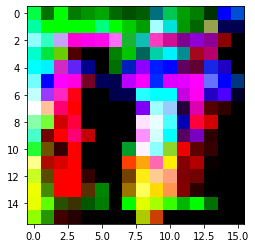

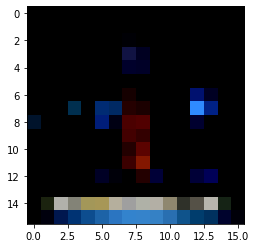

In [ ]:
visualise_A(1)

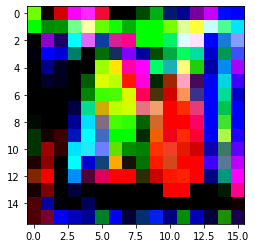

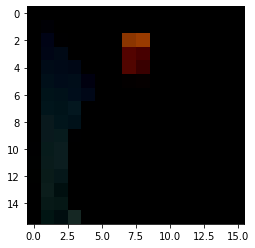

In [ ]:
visualise_B(1)

In [ ]:
#generator
layer1= ConvBlock(64, 128, 3, 2)
layer2= ConvTransBlock(128, 64)
# layer1.to(device)
# layer2.to(device)
gen_A.layers = nn.ModuleList([*gen_A.layers[:1], layer1, layer2, *gen_A.layers[1:]])
gen_B.layers = nn.ModuleList([*gen_B.layers[:1], layer1, layer2, *gen_B.layers[1:]])

#discriminator
dis_A.layers.append(LeakyConvBlock(64, 128, 4, 2).to(device))
dis_B.layers.append(LeakyConvBlock(64, 128, 4, 2).to(device))

print(gen_A)

BaseGenerator(
  (layers): ModuleList(
    (0): ConvBlock(
      (struct): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): ConvBlock(
      (struct): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (2): ConvTransBlock(
      (struct): Sequential(
        (0): ConvTranspose2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
      )
    )
    (3): ConvBlock(
      (struct): Sequential(
        (0): Conv2d(64, 3, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3)

In [ ]:
size = 32

opt = {
    'preprocess': ['resize'],
    'crop_size' : size,
    'load_size' : size,
    'no_flip'   : False,
}

path = "/content/gdrive/MyDrive/DeepFake Project/pytorch-CycleGAN-and-pix2pix-master/datasets/faces"

dataset_A = DeepFakeDataset(os.path.join(path, 'trainA'), 1, transform_params=opt)
dataset_B = DeepFakeDataset(os.path.join(path, 'trainB'), 1, transform_params=opt)

gen_A.to(device)
gen_B.to(device)
dis_A.to(device)
dis_B.to(device)

lr_gen = 1e-4
lr_dis = 3e-4

opt_genA = optim.Adam(gen_A.parameters(), lr=lr_gen)
sch_genA = optim.lr_scheduler.ReduceLROnPlateau(opt_genA, 'max', patience=2)

opt_genB = optim.Adam(gen_B.parameters(), lr=lr_gen)
sch_genB = optim.lr_scheduler.ReduceLROnPlateau(opt_genB, 'max', patience=2)

opt_disA = optim.Adam(dis_A.parameters(), lr=lr_dis)
sch_disA = optim.lr_scheduler.ReduceLROnPlateau(opt_disA, 'max', patience=2)

opt_disB = optim.Adam(dis_B.parameters(), lr=lr_dis)
sch_disB = optim.lr_scheduler.ReduceLROnPlateau(opt_disB, 'max', patience=2)

train(dataset_A, dataset_B, progress=1, split=0.8, epochs=10)

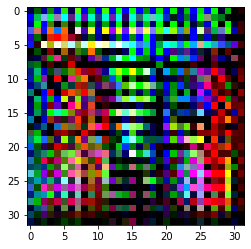

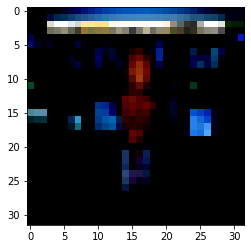

In [ ]:
visualise_A(1)

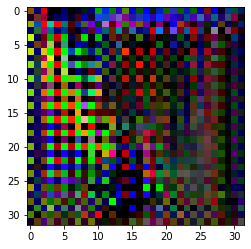

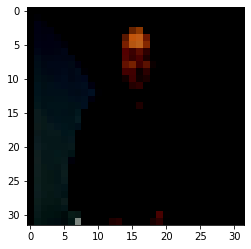

In [ ]:
visualise_B(1)

In [ ]:
layer1= ConvBlock(128, 256, 3, 2)
layer2= ConvTransBlock(256, 128)
layer1.to(device)
layer2.to(device)
gen_A.layers = nn.ModuleList([*gen_A.layers[:2], layer1, layer2, *gen_A.layers[2:]])
gen_B.layers = nn.ModuleList([*gen_B.layers[:2], layer1, layer2, *gen_B.layers[2:]])

#discriminator
dis_A.layers.append(LeakyConvBlock(128, 256, 4, 2).to(device))
dis_B.layers.append(LeakyConvBlock(128, 256, 4, 2).to(device))

In [ ]:
print(gen_A)

In [ ]:
size = 64

opt = {
    'preprocess': ['resize'],
    'crop_size' : size,
    'load_size' : size,
    'no_flip'   : False,
}

path = "/content/gdrive/MyDrive/DeepFake Project/pytorch-CycleGAN-and-pix2pix-master/datasets/faces"

dataset_A = DeepFakeDataset(os.path.join(path, 'trainA'), 1, transform_params=opt)
dataset_B = DeepFakeDataset(os.path.join(path, 'trainB'), 1, transform_params=opt)

gen_A.to(device)
gen_B.to(device)
dis_A.to(device)
dis_B.to(device)

lr_gen = 1e-4
lr_dis = 3e-4

opt_genA = optim.Adam(gen_A.parameters(), lr=lr_gen)
sch_genA = optim.lr_scheduler.ReduceLROnPlateau(opt_genA, 'max', patience=2)

opt_genB = optim.Adam(gen_B.parameters(), lr=lr_gen)
sch_genB = optim.lr_scheduler.ReduceLROnPlateau(opt_genB, 'max', patience=2)

opt_disA = optim.Adam(dis_A.parameters(), lr=lr_dis)
sch_disA = optim.lr_scheduler.ReduceLROnPlateau(opt_disA, 'max', patience=2)

opt_disB = optim.Adam(dis_B.parameters(), lr=lr_dis)
sch_disB = optim.lr_scheduler.ReduceLROnPlateau(opt_disB, 'max', patience=2)

train(dataset_A, dataset_B, progress=2, split=0.8, epochs=10)

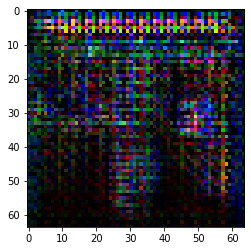

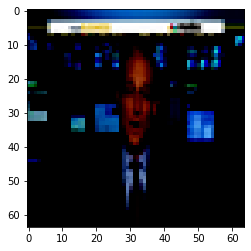

In [ ]:
visualise_A(1)

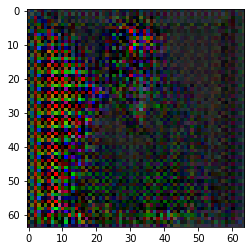

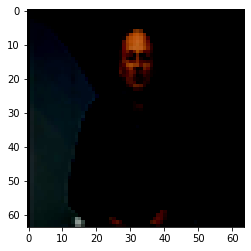

In [ ]:
visualise_B(1)

In [ ]:
# generator
layers1 = [ResidualBlock(256) for i in range(4)]
layers2 = [ResidualBlock(256) for i in range(4)]
gen_A.layers = nn.ModuleList([*gen_A.layers[:3], *layers1, *gen_A.layers[3:]])
gen_B.layers = nn.ModuleList([*gen_B.layers[:3], *layers2, *gen_B.layers[3:]])

# discriminator
dis_A.layers.append(LeakyConvBlock(256, 512, 4, 1).to(device))
dis_B.layers.append(LeakyConvBlock(256, 512, 4, 1).to(device))

In [ ]:
print(gen_A)

In [ ]:
size = 128

opt = {
    'preprocess': ['resize'],
    'crop_size' : size,
    'load_size' : size,
    'no_flip'   : False,
}

path = "/content/gdrive/MyDrive/DeepFake Project/pytorch-CycleGAN-and-pix2pix-master/datasets/faces"

dataset_A = DeepFakeDataset(os.path.join(path, 'trainA'), 1, transform_params=opt)
dataset_B = DeepFakeDataset(os.path.join(path, 'trainB'), 1, transform_params=opt)

gen_A.to(device)
gen_B.to(device)
dis_A.to(device)
dis_B.to(device)

lr_gen = 1e-4
lr_dis = 3e-4

opt_genA = optim.Adam(gen_A.parameters(), lr=lr_gen)
sch_genA = optim.lr_scheduler.ReduceLROnPlateau(opt_genA, 'max', patience=2)

opt_genB = optim.Adam(gen_B.parameters(), lr=lr_gen)
sch_genB = optim.lr_scheduler.ReduceLROnPlateau(opt_genB, 'max', patience=2)

opt_disA = optim.Adam(dis_A.parameters(), lr=lr_dis)
sch_disA = optim.lr_scheduler.ReduceLROnPlateau(opt_disA, 'max', patience=2)

opt_disB = optim.Adam(dis_B.parameters(), lr=lr_dis)
sch_disB = optim.lr_scheduler.ReduceLROnPlateau(opt_disB, 'max', patience=2)

train(dataset_A, dataset_B, progress=3, split=0.8, epochs=20)

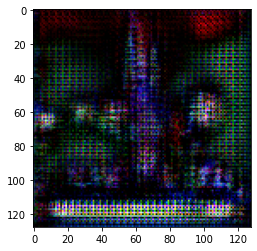

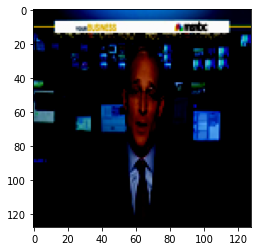

In [ ]:
visualise_A(1)

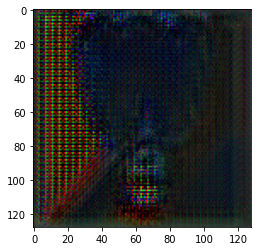

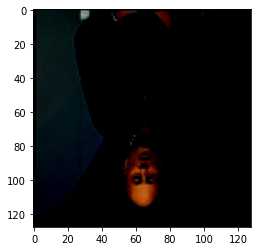

In [ ]:
visualise_B(1)

In [ ]:
layers1 = [ResidualBlock(256) for i in range(4)]
layers2 = [ResidualBlock(256) for i in range(4)]
gen_A.layers = nn.ModuleList([*gen_A.layers[:5], *layers1, *gen_A.layers[5:]])
gen_B.layers = nn.ModuleList([*gen_B.layers[:5], *layers2, *gen_B.layers[5:]])

#discriminator
dis_A.layers.append(LeakyConvBlock(512, 1, 4, 1).to(device))
dis_B.layers.append(LeakyConvBlock(512, 1, 4, 1).to(device))

In [ ]:
print(gen_A)

In [ ]:
size = 256

opt = {
    'preprocess': ['resize'],
    'crop_size' : size,
    'load_size' : size,
    'no_flip'   : False,
}

path = "/content/gdrive/MyDrive/DeepFake Project/pytorch-CycleGAN-and-pix2pix-master/datasets/faces"

dataset_A = DeepFakeDataset(os.path.join(path, 'trainA'), 1, transform_params=opt)
dataset_B = DeepFakeDataset(os.path.join(path, 'trainB'), 1, transform_params=opt)

gen_A.to(device)
gen_B.to(device)
dis_A.to(device)
dis_B.to(device)

lr_gen = 1e-4
lr_dis = 3e-4

opt_genA = optim.Adam(gen_A.parameters(), lr=lr_gen)
sch_genA = optim.lr_scheduler.ReduceLROnPlateau(opt_genA, 'max', patience=2)

opt_genB = optim.Adam(gen_B.parameters(), lr=lr_gen)
sch_genB = optim.lr_scheduler.ReduceLROnPlateau(opt_genB, 'max', patience=2)

opt_disA = optim.Adam(dis_A.parameters(), lr=lr_dis)
sch_disA = optim.lr_scheduler.ReduceLROnPlateau(opt_disA, 'max', patience=2)

opt_disB = optim.Adam(dis_B.parameters(), lr=lr_dis)
sch_disB = optim.lr_scheduler.ReduceLROnPlateau(opt_disB, 'max', patience=2)

train(dataset_A, dataset_B, progress=4, split=0.8, epochs=20)

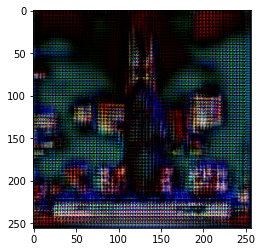

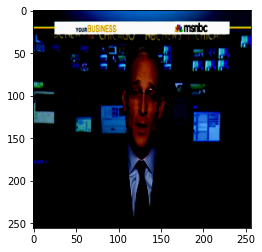

In [ ]:
visualise_A(1)

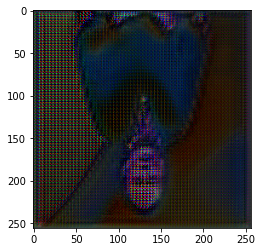

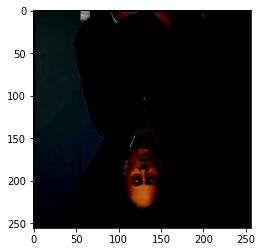

In [ ]:
visualise_B(1)

In [ ]:
%load_ext tensorboard
!pwd

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
/content


In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/DeepFake\ Project/Original/runs/

Reusing TensorBoard on port 6006 (pid 1713), started 1:29:01 ago. (Use '!kill 1713' to kill it.)

<IPython.core.display.Javascript object>